In [11]:
import sys
import pandas as pd
import numpy as np
import tensorflow as tf
import json
import string
import re
import time
import mplcursors

from datetime import datetime

import numpy as np
import torch
from torch.utils.data import DataLoader
from transformers import AutoTokenizer, AutoModel
from tqdm import tqdm
import torch.nn.functional as F
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [22]:
JSON_8 = "/Users/sro/2024ML-Research/Performance_Metrics/datasets/minor_train_processed.json"
minor_train = pd.read_json(JSON_8, lines = "True")
categories = minor_train['primary_subfield']
primary_categories_train = [category.split()[0] for category in categories]

X_train_embeddings = np.load('/Users/sro/2024ML-Research/MPNet/MPNet_train_embeddings.npy')

In [24]:
minor_train

,paper_id,version,yymm,created,title,secondary_subfield,abstract,primary_subfield,field,fulltext,processed_title_abstract_fulltext,processed_title_abstract
0,1501.03486,2,1501,2015-01-16T10:15:42,A spin-wave logic gate based on a width-modula...,[cond-mat.mes-hall],An electric current controlled spin-wave logic...,cond-mat.mes-hall,cond-mat,A spin-wave logic gate based on a width-modula...,"[spinwave, logic, gate, based, widthmodulated,...","[spinwave, logic, gate, based, widthmodulated,..."
1,0908.4485,2,908,2010-03-15T10:35:23,Discontinuous Euler instability in nanoelectro...,[cond-mat.mes-hall],We investigate nanoelectromechanical systems n...,cond-mat.mes-hall,cond-mat,\nDiscontinuous Euler instability in nanoelect...,"[discontinuous, euler, instability, nanoelectr...","[discontinuous, euler, instability, nanoelectr..."
2,1007.3144,1,1007,2010-07-19T13:24:01,Polarization dependence of coherent phonon gen...,[cond-mat.mes-hall],We have investigated the polarization dependen...,cond-mat.mes-hall,cond-mat,\nPolarization dependence of coherent phonon g...,"[polarization, dependence, coherent, phonon, g...","[polarization, dependence, coherent, phonon, g..."
3,1607.04802,2,1607,2016-09-07T10:45:25,Heat production and error probability relation...,"[cond-mat.mes-hall, cond-mat.stat-mech]",The erasure of a classical bit of information ...,cond-mat.mes-hall,cond-mat,\nHeat production and error probability relati...,"[heat, production, error, probability, relatio...","[heat, production, error, probability, relatio..."
4,1109.0619,1,1109,2011-09-03T13:19:56,Magnetic Fields Effects on the Electronic Cond...,[cond-mat.mes-hall],While mesoscopic conducting loops are sensitiv...,cond-mat.mes-hall,cond-mat,Magnetic Fields Effects on the Electronic Cond...,"[magnetic, fields, effects, electronic, conduc...","[magnetic, fields, effects, electronic, conduc..."
...,...,...,...,...,...,...,...,...,...,...,...,...
108691,1805.08275,2,1805,2019-09-02T22:19:55,Multiple Treatments with Strategic Interaction,"[econ.EM, stat.AP, stat.ME]",We develop an empirical framework to identify ...,econ.EM,econ,\nMultiple Treatments with Strategic Interacti...,"[multiple, treatments, strategic, interaction,...","[multiple, treatments, strategic, interaction,..."
108692,1808.03109,1,1808,2018-08-09T12:10:14,Change Point Estimation in Panel Data with Tim...,"[econ.EM, stat.AP]",This paper proposes a method for estimating mu...,econ.EM,econ,\nChange Point Estimation in Panel Data with T...,"[change, point, estimation, panel, data, timev...","[change, point, estimation, panel, data, timev..."
108693,1902.06143,1,1902,2019-02-16T19:36:11,Weak Identification and Estimation of Social I...,[econ.EM],The identification of the network effect is ba...,econ.EM,econ,\nWeak Identification and Estimation of Social...,"[weak, identification, estimation, social, int...","[weak, identification, estimation, social, int..."
108694,1905.02107,3,1905,2019-08-21T14:36:40,Lasso under Multi-way Clustering: Estimation a...,[econ.EM],This paper studies high-dimensional regression...,econ.EM,econ,\nLASSO UNDER MULTI-WAY CLUSTERING:\n\nESTIMAT...,"[lasso, multiway, clustering, estimation, post...","[lasso, multiway, clustering, estimation, post..."


In [25]:
X_train_embeddings[:1].shape

(1, 768)

In [26]:
# Perform PCA for 3D visualization
pca = PCA(n_components=3)
train_embeddings_3d = pca.fit_transform(X_train_embeddings)
print("Dimensionality of transformed embeddings: " + str(train_embeddings_3d.shape))
train_embeddings_3d[:5]

Dimensionality of transformed embeddings: (108696, 3)


array([[0.45119554, 0.39685956, 0.23933458],
       [0.27145886, 0.58844244, 0.32075644],
       [0.20100673, 0.43655738, 0.41034782],
       [0.57523257, 0.4737554 , 0.01703242],
       [0.2552061 , 0.43455958, 0.50003153]], dtype=float32)

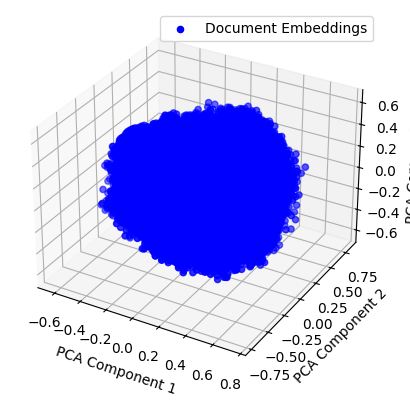

In [27]:
# Plot the 3D embeddings
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(train_embeddings_3d[:, 0], train_embeddings_3d[:, 1], train_embeddings_3d[:, 2], c='blue', label='Document Embeddings')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.legend()
plt.show()

In [29]:
# Generate 100,000 random indices
# random_indices = np.random.choice(len(train_embeddings_3d), size=100000, replace=False)

# Create a DataFrame with embeddings and tags
df = pd.DataFrame(train_embeddings_3d, columns=['x', 'y', 'z'])
#df['categories'] = y_train.apply(lambda x: x[1])

# Subset the numpy array using the random indices
# subset_new_values = train_embeddings_3d[random_indices]
# subset_new_values_df = pd.DataFrame(subset_new_values, columns=['x', 'y', 'z'])

# Subset the pandas DataFrame using the random indices
# subset_df = df.iloc[random_indices]
df.head()

,x,y,z
0,0.451196,0.396860,0.239335
1,0.271459,0.588442,0.320756
2,0.201007,0.436557,0.410348
3,0.575233,0.473755,0.017032
4,0.255206,0.434560,0.500032


In [31]:
import plotly.express as px

fig = px.scatter_3d(df, x='x', y='y', z='z', color = primary_categories_train, labels={'color': 'categories'})

# Update layout and traces if needed
fig.update_traces(marker_size=2)

fig.show()

In [32]:
# Export to PNG, JPEG, or SVG (choose one)
fig.write_html('arXiv_Embedding_Space.html')

# fig.write_image('scatter_plot.png')  # or 'scatter_plot.jpeg' or 'scatter_plot.svg'